<a href="https://colab.research.google.com/github/PaulaJosefine/PaulaJosefine/blob/main/Starfysh_tutorial_mechanosensing_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Starfysh tutorial 1: basic deconvolution on real dataset

**Azizi Lab**

Siyu He, Yinuo Jin

12-11-2022

This is a tutorial on an example real Spatial Transcriptomics (ST) [data](https://drive.google.com/drive/folders/1RIp0Z2eF1m8Ortx0sgB4z5g5ISsRFzJ4?usp=share_link) (`CID44971_TNBC`) from [Wu *et al.*, 2021](https://www.nature.com/articles/s41588-021-00911-1).

## Overview
Starfysh performs cell-type deconvolution followed by various downstream analyses to discover spatial interactions in tumor microenvironment. Specifically, Starfysh looks for *anchor spots*, defined as the spots with the highest proportion of a given cell type, and further deconvolves the remaining spots. This process is guided by user-provided signatures ([see example](https://drive.google.com/file/d/1yAfAj7PaFJZph88MwhWNXL5Kx5dKMngZ/view?usp=share_link)). Starfysh provides the following options:

**Base feature**:

- Auxiliary Variational AutoEncoder (AVAE):<br>
  Spot-level deconvolution with expected cell types and corresponding annotated *signature* gene sets (default)

**Optional**:

- Archetypal Analysis (AA):<br>

    *If signature is not provided*: (example updated soon!)
    
    - Unsupervised cell type annotation (if the input *signature* is not provided)

    *If signature is provided*:
    
    - Novel cell type / cell state discovery (complementary to known cell types from the *signatures*)
    - Refine known marker genes by appending archetype-specific differentially expressed genes, and update anchor spots accordingly
    

- Product-of-Experts (PoE) integration:<br>
    *Example updated soon!*<br>
    
    Multi-modal integrative predictions with *expression* & *histology image* by leverging additional side information (e.g. cell density) from H&E image.


In [ ]:
# Please restart the runtime after running this code block. After restarting, you may skip this code block. 
import sys
import os
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip3 install scanpy
    !pip install git+https://github.com/azizilab/starfysh.git
    !pip install scikit-image --upgrade
    !pip install matplotlib==2.2.3
    from google.colab import drive
    drive.mount('/content/drive')
    path = '/content/drive/MyDrive/Starfysh_run'
    isExist = os.path.exists(path)
    if not isExist:
      os.mkdir(path)
      print("Directory '% s' created" % path)
    sys.path.append(path)
    %cd $path

- A folder named "Starfysh_run" will be created automated in your google drive, and all the data and results will be saved.
- Modify the path above if you don't want to save it.

In [ ]:
import numpy as np
import pandas as pd
import torch

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.font_manager
from matplotlib import rcParams

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 10})
rcParams.update({'figure.dpi': 300})
rcParams.update({'figure.figsize': (3,3)})
rcParams.update({'savefig.dpi': 500})

import warnings
warnings.filterwarnings('ignore')

## Load starfysh

In [ ]:
from starfysh import (utils,
                      plot_utils,
                      starfysh,
                      post_analysis,
                      AA
                     )

### (1). load data and marker genes

File Input:
- Spatial transcriptomics
    - Count matrix: `adata`
    - (Optional): Paired histology & spot coordinates: `img`, `map_info`

- Annotated signatures (marker genes) for potential cell types: `gene_sig`

Starfysh is built upon scanpy and Anndata. The common ST/Visium data sample folder consists a expression count file (usually `filtered_featyur_bc_matrix.h5`), and a subdirectory with corresponding H&E image and spatial information, as provided by Visium platform.

For example, our example real ST data has the following structure:
```
├── ../data
    bc_signatures_version_1013.csv

    ├── P1A_ER:
        \__ filtered_feature_bc_mactrix.h5

        ├── spatial:
            \__ aligned_fiducials.jpg
                detected_tissue_image.jpg
                scalefactors_json.json
                tissue_hires_image.png
                tissue_lowres_image.png
                tissue_positions_list.csv
```

For data that doesn't follow the common visium data structure (e.g. missing `filtered_featyur_bc_matrix.h5` or the given `.h5ad` count matrix file lacks spatial metadata), please construct the data as Anndata synthesizing information as the example simulated data shows:

**[Note]**: 
- The most simple way to prepare the datasets is following the code `automated_prepare_data_on_colab` below to automatedly download our shared google file.

- If you're running this tutorial locally or want to explore datasets we provided, please download the sample [data](https://drive.google.com/drive/folders/1RIp0Z2eF1m8Ortx0sgB4z5g5ISsRFzJ4?usp=share_link) and [signature gene sets](https://drive.google.com/file/d/1yAfAj7PaFJZph88MwhWNXL5Kx5dKMngZ/view?usp=share_link), and save it in the relative path `../data` (otherwise please modify the `data_path` defined in the cell below):

In [ ]:
def automated_prepare_data_on_colab():
    path = 'data'
    isExist = os.path.exists(path)
    if not isExist:
      os.mkdir(path)
      print("Directory '% s' created" % path)
    path = 'data/CID44971'
    isExist = os.path.exists(path)
    if not isExist:
      os.mkdir(path)
      print("Directory '% s' created" % path)
    path = 'data/CID44971/spatial'
    isExist = os.path.exists(path)
    if not isExist:
      os.mkdir(path)
      print("Directory '% s' created" % path)
    !gdown https://drive.google.com/drive/folders/1BnfdAP6LehXkyKWkGlRhkz4fsZ1XKAlL?usp=sharing -O  data/CID44971/spatial --folder
    !gdown --fuzzy https://drive.google.com/file/d/15MLrhb6tpA0zYZmD6vqezqTyscg7NMzl/view?usp=share_link -O  data/CID44971/CID44971.h5ad
    !gdown --fuzzy https://drive.google.com/file/d/1yAfAj7PaFJZph88MwhWNXL5Kx5dKMngZ/view?usp=sharing -O data/bc_signatures_version_1013.csv 

In [ ]:
import os
automated_prepare_data_on_colab()

Directory 'data' created
Directory 'data/CID44971' created
Directory 'data/CID44971/spatial' created
Retrieving folder list
Processing file 1BEJXq4yG_KdvJeORgl22YOtIKyWca2qQ aligned_fiducials.jpg
Processing file 14Pjm092pG0CiRsxysQZqujdqyI6_X1cQ detected_tissue_image.jpg
Processing file 1PULnTiyAOPdiBkif92xGWZEYpDuMm2WW scalefactors_json.json
Processing file 1UFwp0SEwvxiM0BSQdmRtFHOpRd15Q307 tissue_hires_image.png
Processing file 1DBxCSYOx-UW6o6ChfyTjokeNxgB9p-Xq tissue_lowres_image.png
Processing file 1d-QHqWgu7vVhuuFdyCbTCHuXmTFRhSzW tissue_positions_list.csv
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1BEJXq4yG_KdvJeORgl22YOtIKyWca2qQ
To: /content/data/CID44971/spatial/aligned_fiducials.jpg
100% 1.42M/1.42M [00:00<00:00, 128MB/s]
Downloading...
From: https://drive.google.com/uc?id=14Pjm092pG0CiRsxysQZqujdqyI6_X1cQ
To: /content/data/CID44971/spatial/detected_tissue_image.jpg
1

In [ ]:
# Specify data paths
data_path = 'data'
sample_id = 'CID44971'
sig_name = 'bc_signatures_version_1013.csv'

In [ ]:
# Load expression counts and signature gene sets
adata, adata_normed = utils.load_adata(data_folder=data_path,
                                       sample_id=sample_id, # sample id
                                       n_genes=2000  # number of highly variable genes to keep
                                       )

[2023-01-18 01:47:22] Preprocessing1: delete the mt and rp
[2023-01-18 01:47:39] Preprocessing2: Normalize
[2023-01-18 01:47:39] Preprocessing3: Logarithm
[2023-01-18 01:47:40] Preprocessing4: Find the variable genes


In [ ]:
gene_sig = pd.read_csv(os.path.join(data_path, sig_name))
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())
gene_sig.head()

,Basal,LumA,LumB,MBC,CSC,Normal epithelial,Tcm,Tem,Tfh,Treg,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,CD44,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,ESA,KRT17,LTB,ANXA1,NMB,LTB,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,CD133,LTF,IL7R,CXCR4,NR3C1,IL32,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,ALDH1,KRT15,SARAF,KLRB1,DUSP4,BATF,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,CD24,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


**If there's no input signature gene sets, Starfysh defines "archetypal marker genes" as *signatures*. Please refer to the following code snippet and see details in section (3).**

```Python
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)
gene_sig = aa_model.find_markers(n_markers=30, display=False)
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())
gene_sig.head()
```


In [ ]:
adata

AnnData object with n_obs × n_vars = 1162 × 18967
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: '_index', 'features', 'highly_variable'

ImportError: ignored

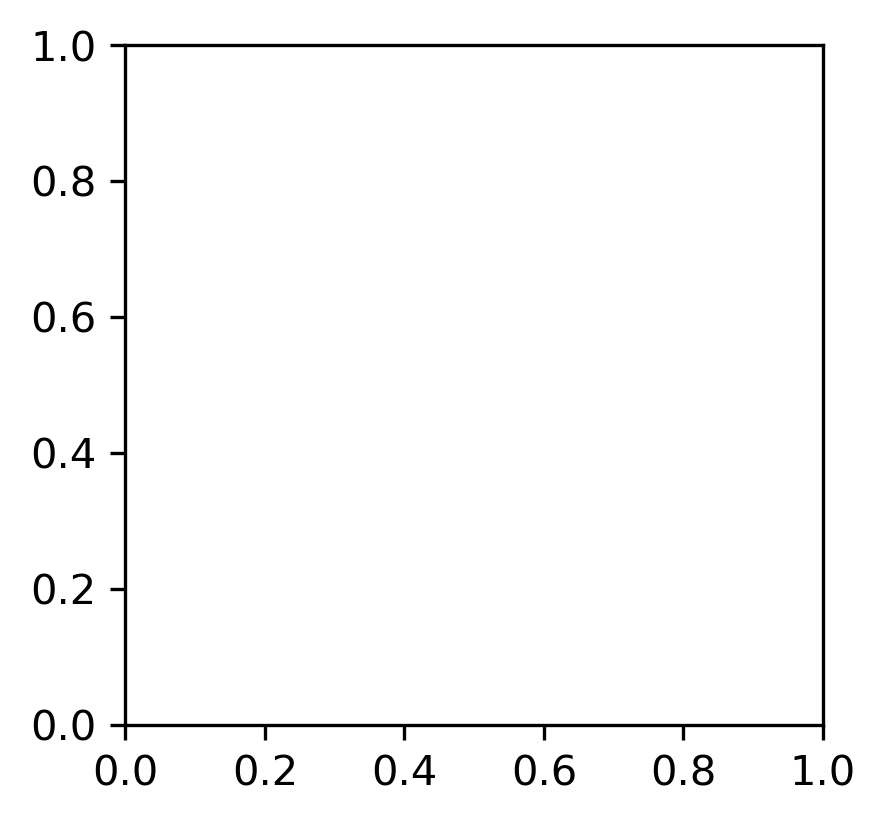

In [ ]:
# Load spatial information
img_metadata = utils.preprocess_img(data_path,
                                    sample_id,
                                    adata_index=adata.obs.index,
                                    hchannel=False
                                    )
img, map_info, scalefactor = img_metadata['img'], img_metadata['map_info'], img_metadata['scalefactor']

umap_df = utils.get_umap(adata, display=True)

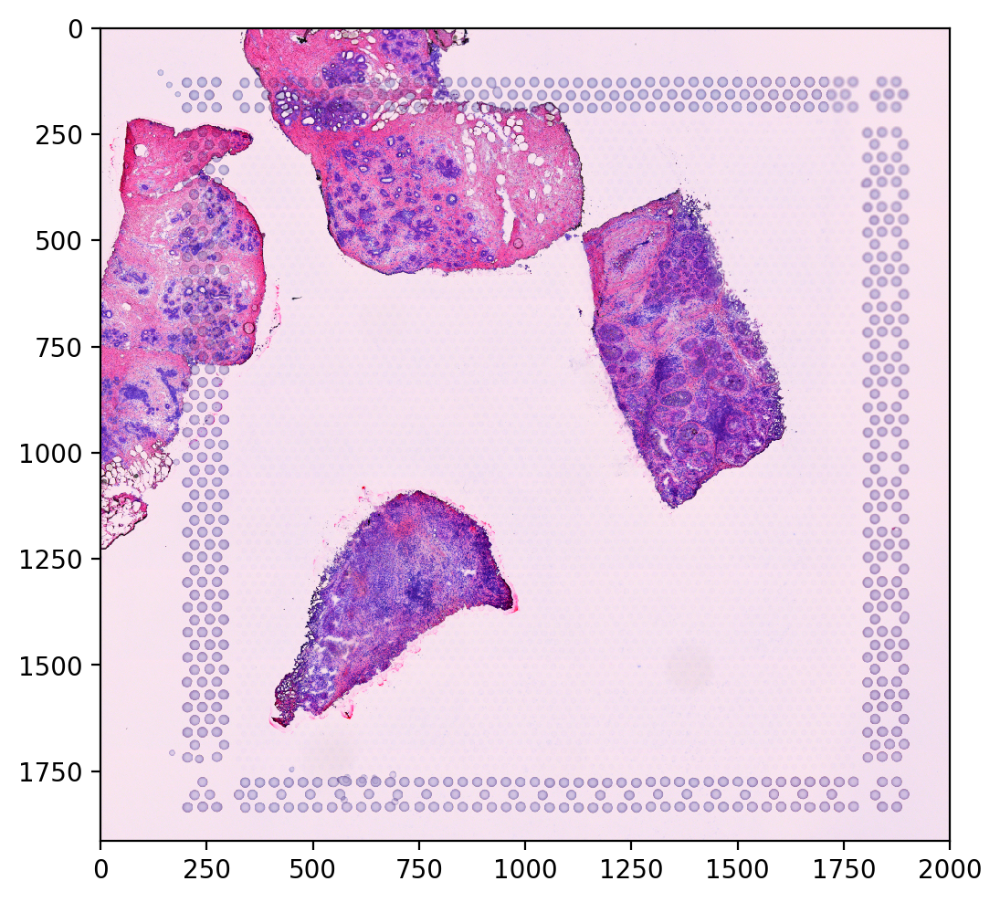

In [ ]:
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(img)
plt.show()

In [ ]:
map_info.head()

,array_row,array_col,imagerow,imagecol,sample
AACATTGGTCAGCCGT-1,3,17,282.131013,520.522390,CID44971
CATCGAATGGATCTCT-1,3,19,282.131013,543.117747,CID44971
CGGGTTGTAGCTTTGG-1,3,21,282.131013,565.920401,CID44971
CCTAAGTGTCTAACCG-1,2,22,262.437812,577.114430,CID44971
TCTGTGACTGACCGTT-1,3,23,282.131013,588.515757,CID44971


### (2). Preprocessing (finding anchor spots)
- Identify anchor spot locations.

Instantiate parameters for Starfysh model training:
- Raw & normalized counts after taking highly variable genes
- filtered signature genes
- library size & spatial smoothed library size (log-transformed)
- Anchor spot indices (`anchors_df`) for each cell type & their signature means (`sig_means`)


In [ ]:
# Parameters for training
visium_args = utils.VisiumArguments(adata,
                                    adata_normed,
                                    gene_sig,
                                    img_metadata,
                                    n_anchors=60,
                                    window_size=3,
                                    sample_id=sample_id
                                   )

adata, adata_normed = visium_args.get_adata()
anchors_df = visium_args.get_anchors()


[2023-01-18 01:56:21] Subsetting highly variable & signature genes ...
[2023-01-18 01:56:21] Smoothing library size by taking averaging with neighbor spots...
[2023-01-18 01:56:23] Retrieving & normalizing signature gene expressions...
[2023-01-18 01:56:23] Identifying anchor spots (highly expression of specific cell-type signatures)...


- Visualize the spatial data

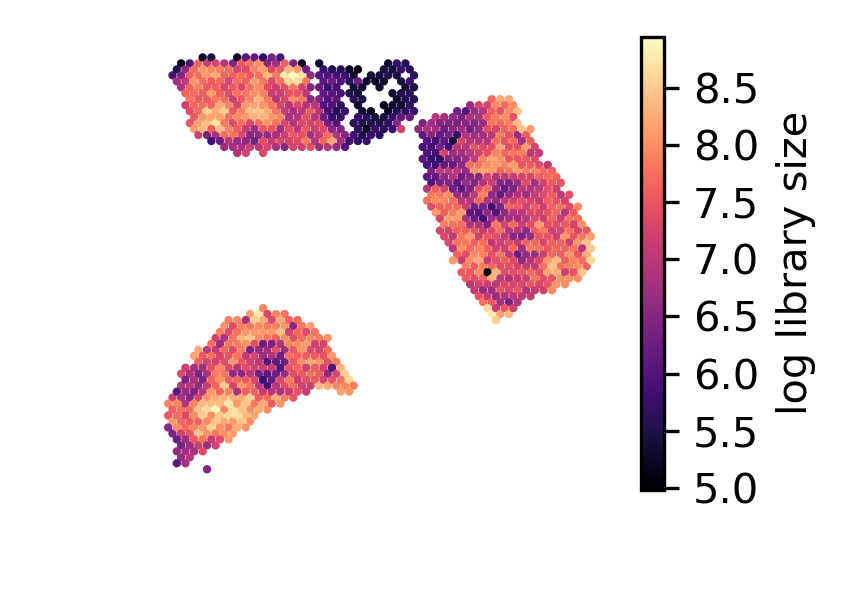

In [ ]:
plot_utils.plot_spatial_feature(adata,
                                map_info,
                                visium_args.log_lib,
                                label='log library size'
                               )

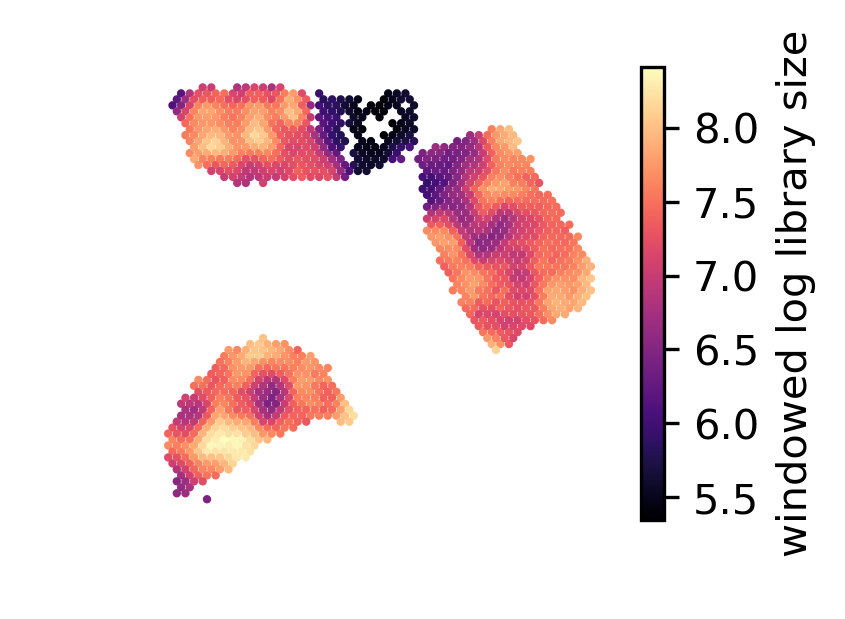

In [ ]:
plot_utils.plot_spatial_feature(adata,
                                map_info,
                                visium_args.win_loglib,
                                label='windowed log library size',
                                )

plot raw gene expression:

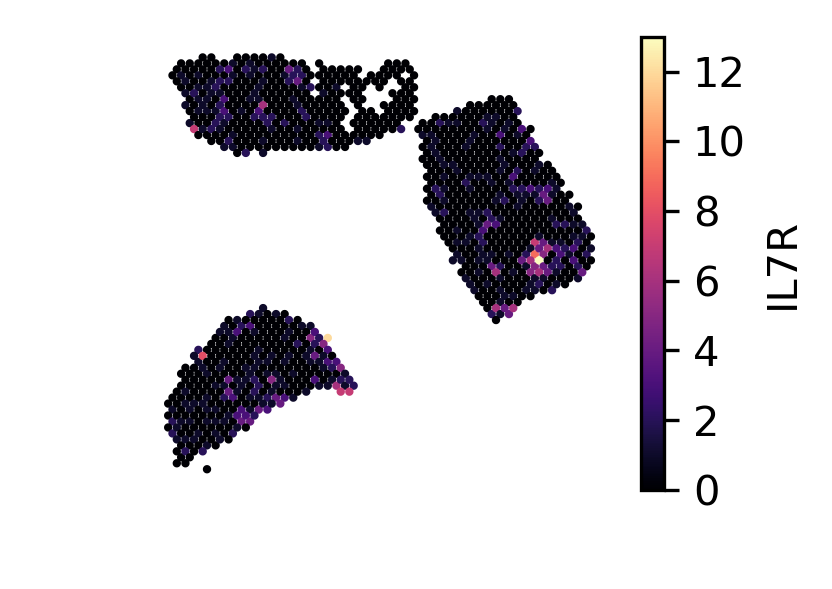

In [ ]:
plot_utils.plot_spatial_gene(adata,
                             map_info,
                             gene_name='IL7R')

- Visualize anchor spots

In [ ]:
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

NameError: ignored

### (3). Optional: archetypal analysis
Overview:
If users don't provide annotated gene signature sets with cell types, Starfysh annotates cell types via archetypal analysis (AA). The underlying assumption is that the geometric "extremes" are identified as the purest cell types, whereas all other spots are mixture of the "archetypes". If the users provide the gene signature sets, they can still optionally apply AA to refine marker genes and update anchor spots for known cell types. In addition, AA can identify potential novel cell types / states. Here are the overview features provided by the AA step:
- Finding archetypal spots & assign 1-1 mapping to their closest anchor spot neighbors
- Finding archetypal marker genes & append them to marker genes of annotated cell types
- Find novel cell type / cell states as the most distant archetypes


#### If signature genes aren't provided

```Python
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)

# (1). Find archetypal spots & archetypal clusters
arche_df = aa_model.find_archetypal_spots(major=True)

# (2). Define "signature genes" as marker genes associated with each archetypal cluster
gene_sig = aa_model.find_markers(n_markers=30, display=False)
gene_sig.head()
```


#### If signature genes are provided

In [ ]:
aa_model = AA.ArchetypalAnalysis(adata_orig=adata_normed)
archetype, arche_dict, major_idx, evs = aa_model.compute_archetypes(r=40)
# (1). Find archetypal spots & archetypal clusters
arche_df = aa_model.find_archetypal_spots(major=True)

# (2). Find marker genes associated with each archetypal cluster
markers_df = aa_model.find_markers(n_markers=30, display=False)

# (3). Map archetypes to closest anchors (1-1 per cell type)
map_df, map_dict = aa_model.assign_archetypes(anchors_df)

# (4). Optional: Find the most distant archetypes that are not assigned to any annotated cell types
distant_arches = aa_model.find_distant_archetypes(anchors_df, n=3)

[2023-01-18 01:56:28] Computing intrinsic dimension to estimate k...


30 components are retained using conditional_number=30.00


[2023-01-18 01:56:29] Estimating lower bound of # archetype as 12...


In [ ]:
plot_utils.plot_evs(evs, kmin=aa_model.kmin)

- Visualize archetypes

In [ ]:
aa_model.plot_archetypes(do_3d=False, major=True, disp_cluster=False)

-  Visualize overlapping ratio between archetypal & anchor spots:


In [ ]:
aa_model.plot_mapping(map_df)

-  Application: appending marker genes
   Append archetypal marker genes with the best-aligned anchors:

In [ ]:
visium_args = utils.refine_anchors(
    visium_args,
    aa_model,
    n_genes=5,
    n_iters=1
)

## Run starfysh

We perform `n_repeat` random restarts and select the best model with lowest loss for parameter `c` (inferred cell-type proportions):


### (1). Model parameters

In [ ]:
n_repeats = 3
epochs = 100
patience = 10
device = torch.device('cpu')

### (2). Model training

#### Base Starfysh deconvolution with ST count matrix (without PoE)

In [ ]:
# Run models
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 patience=patience,
                                 device=device
                                )

#### Starfysh deconvolution with histology integration (PoE)

We perform integrative inference of both gene expression and histology matrices with Products of Expert model, which projects different data modalities into the joint latent space to aid deconvolution with actual spatial information.

In [ ]:
model_poe, loss_poe = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 patience=patience,
                                 poe=True,
                                 device=device
                                 )

### (3). Basic downstream analysis

#### Parse Starfysh inference output (**Starfysh without PoE**)

In [ ]:
inference_outputs, generative_outputs, px = starfysh.model_eval(model,
                                                                adata,
                                                                visium_args.sig_mean,
                                                                device,
                                                                visium_args.log_lib,
                                                               )
u = post_analysis.get_z_umap(inference_outputs, map_info)
u = pd.DataFrame(u,columns=['umap1','umap2'])
u.index = map_info.index

#### Parse Starfysh inference output (**Starfysh with PoE**)
Skip this if you don't want to integrate images

In [ ]:
inference_outputs_poe = model_poe.inference(torch.Tensor(adata.to_df().values).to(device))
img_outputs = model_poe.predict_imgVAE(torch.Tensor(visium_args.get_img_patches()).float().to(device))
sig_means = torch.Tensor(visium_args.sig_mean_znorm.values).to(device)
generative_outputs_poe = model_poe.generative(
    inference_outputs,
    sig_means,
    img_outputs
)

u_poe = post_analysis.get_z_umap(inference_outputs_poe, map_info)
u_poe = pd.DataFrame(u,columns=['umap1','umap2'])
u_poe.index = map_info.index

#### Visualize starfysh deconvolution results (without PoE)



##### Gene sig mean vs. inferred prop

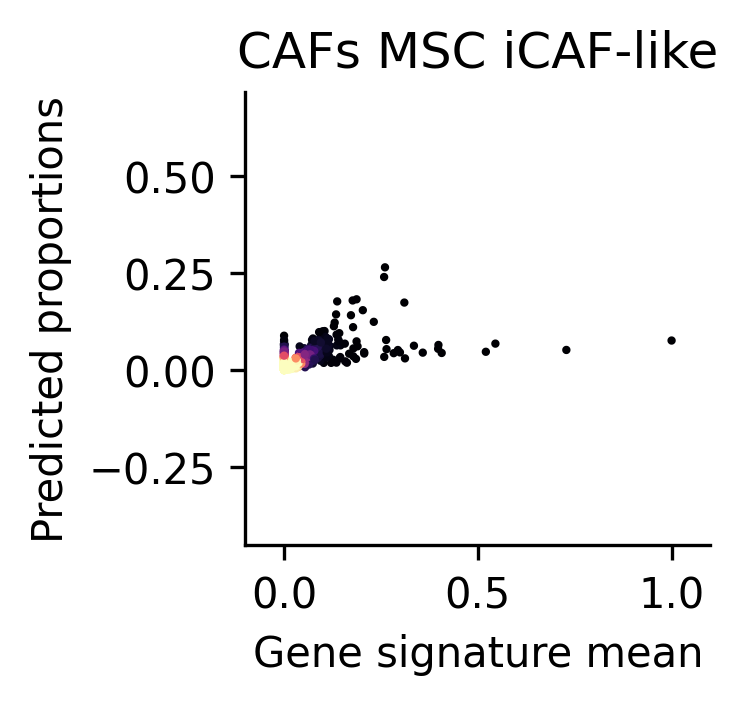

In [ ]:
from scipy.stats import pearsonr, gaussian_kde
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
def gene_mean_vs_inferred_prop(inference_outputs, visium_args,idx):
    
    sig_mean_n_df = pd.DataFrame(
    np.array(visium_args.sig_mean_znorm)/(np.sum(np.array(visium_args.sig_mean_znorm),axis=1,keepdims=True)+1e-5),
    columns=visium_args.sig_mean_znorm.columns,
    index=visium_args.sig_mean_znorm.index
    )

    qc_m = inference_outputs["qc_m"].detach().cpu().numpy()
    
    figs,ax=plt.subplots(1,1,dpi=300,figsize=(2,2))
    
    v1 = sig_mean_n_df.iloc[:,idx].values
    v2 = qc_m[:,idx]
    
    v_stacked = np.vstack([v1, v2])
    den = gaussian_kde(v_stacked)(v_stacked)
    
    ax.scatter(v1,v2,c=den,s=1,cmap='magma',vmax=den.max()/3)
    
    ax.set_aspect('equal')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.axis('equal')
    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    plt.title(visium_args.gene_sig.columns[idx])
    plt.xlim([v1.min()-0.1,v1.max()+0.1])
    plt.ylim([v2.min()-0.1,v2.max()+0.1])
    #plt.xticks(np.arange(0,1.1,0.5))
    #plt.yticks(np.arange(0,1.1,0.5))
    plt.xlabel('Gene signature mean')
    plt.ylabel('Predicted proportions')


gene_mean_vs_inferred_prop(inference_outputs,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial visualizations - estimated tissue density


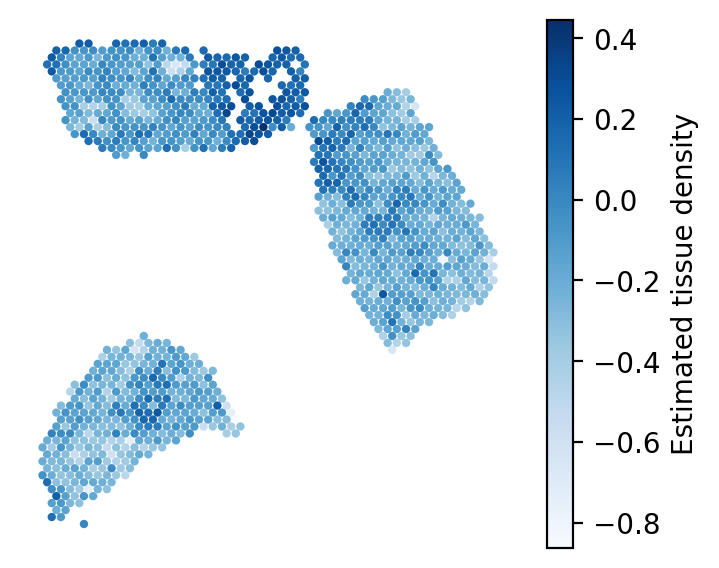

In [ ]:
plot_utils.pl_spatial_inf_feature(adata,
                                  map_info,
                                  inference_outputs,
                                  feature='ql_m',
                                  idx=0,
                                  plt_title='',
                                  label='Estimated tissue density',
                                  s=4,
                                  cmap='Blues'
                                  #vmax=3
                                 )

##### Spatial visualizations - Inferred cell-type proportions

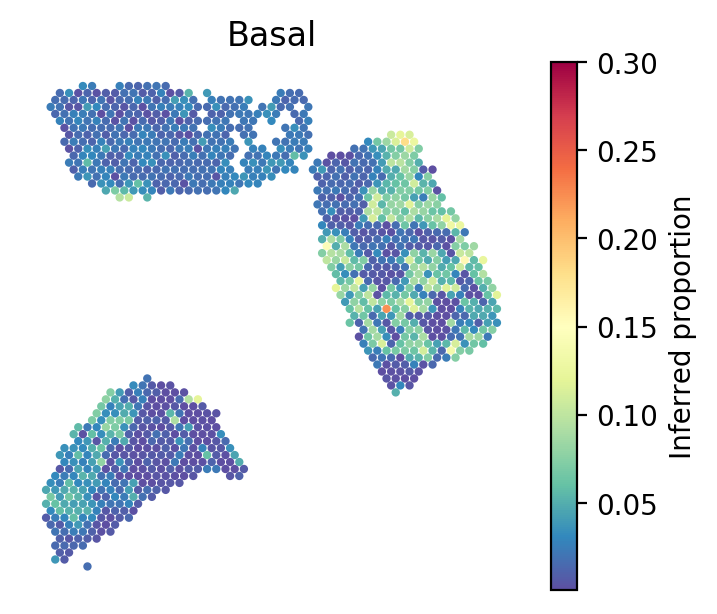

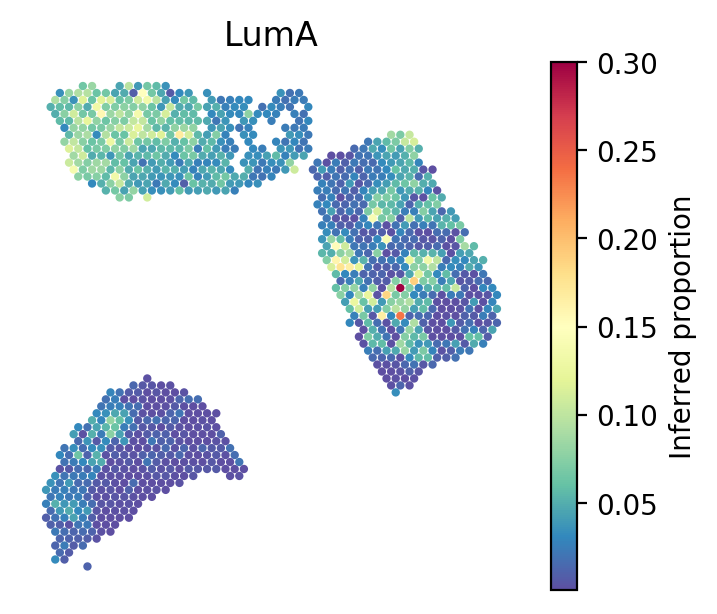

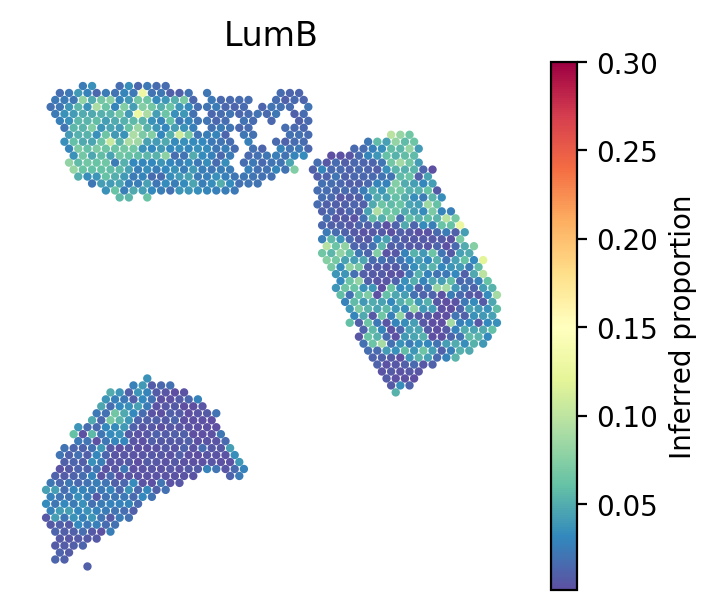

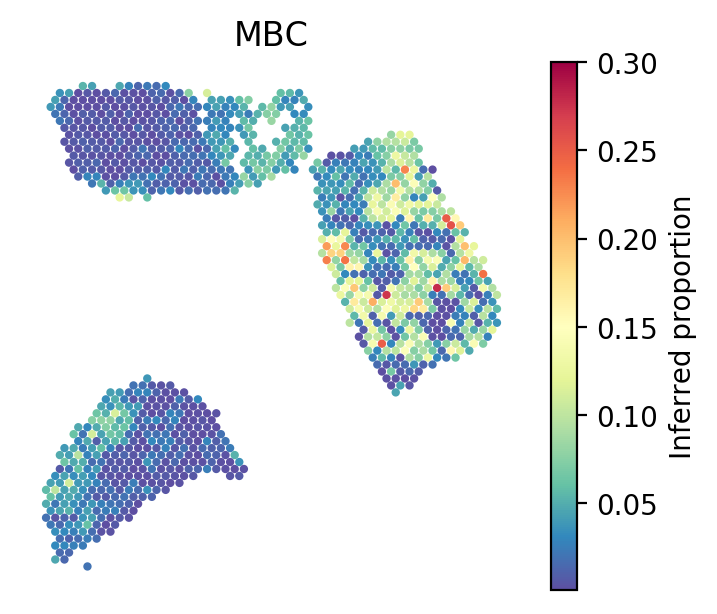

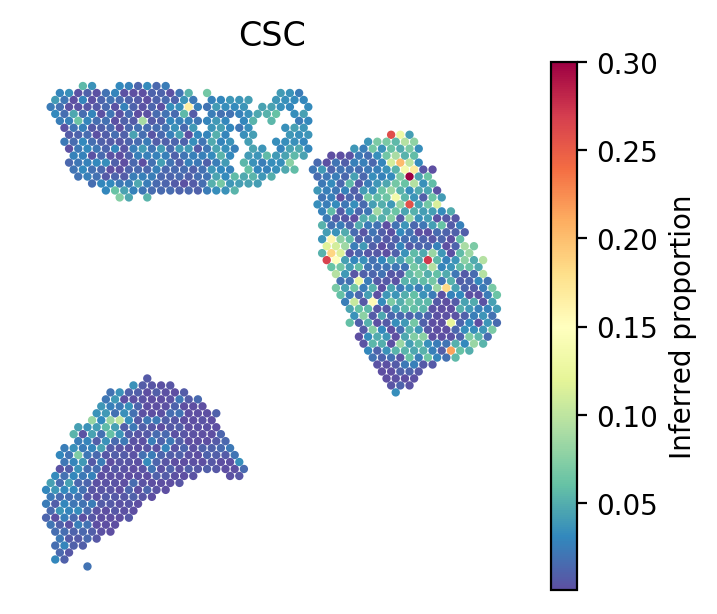

...

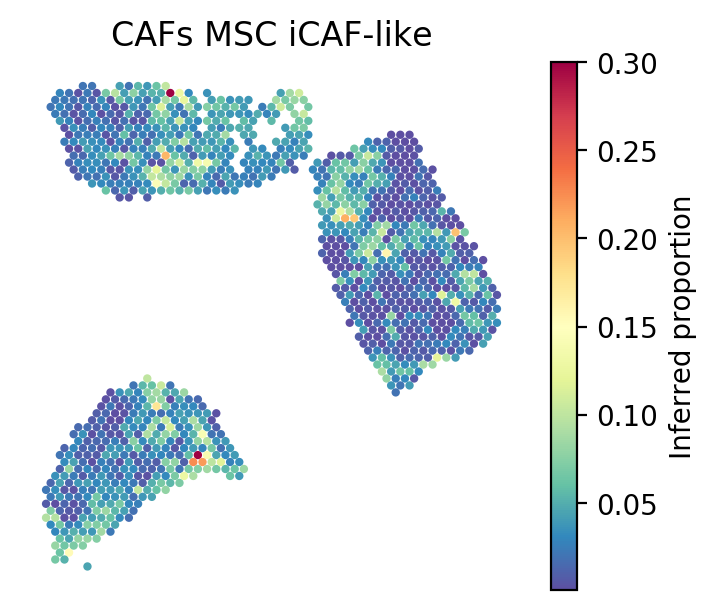

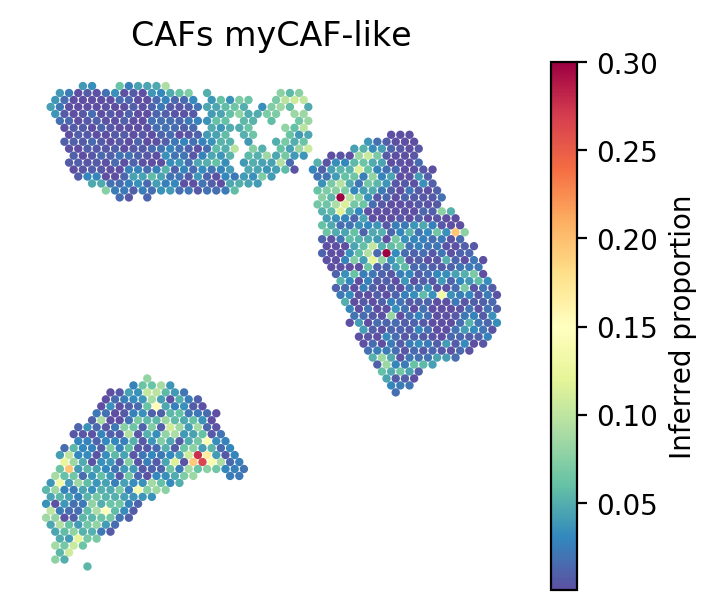

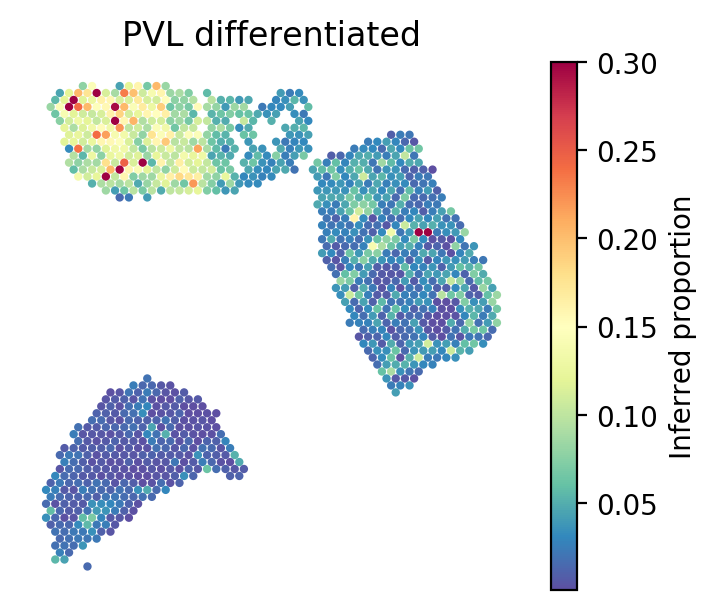

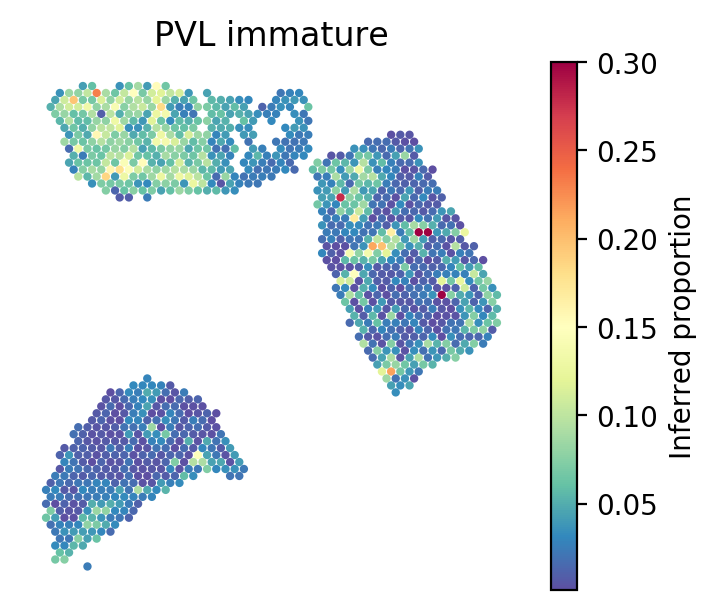

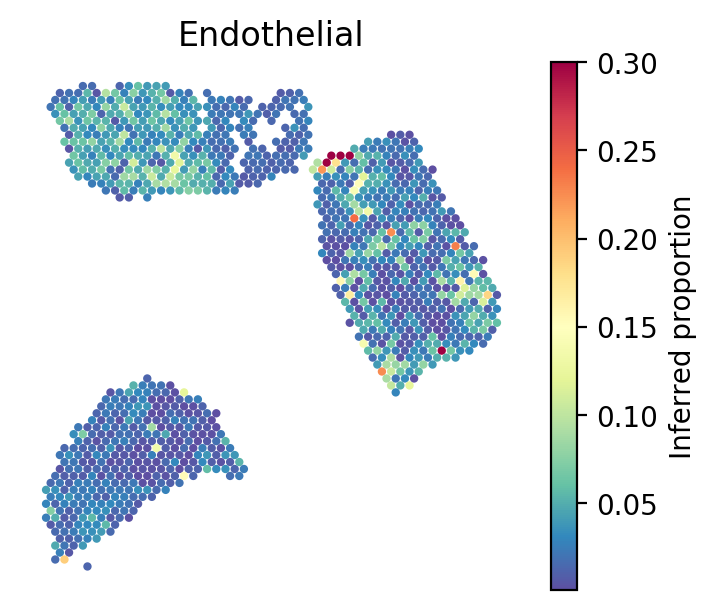

In [ ]:
# Randomly choose cell types to visualize
celltype_indices = np.random.randint(0, n_cell_types, size=5)

for idx in celltype_indices:

    # Inferred proportions on ST spatial coordinates
    plot_utils.pl_spatial_inf_feature(adata,
                       map_info,
                       inference_outputs,
                       feature='qc_m',
                       idx=idx,
                       plt_title=gene_sig.columns[idx],
                       label='Inferred proportion',
                       s=4,
                       vmax=0.8
                       )


##### UMAP visualizations - Inferred cell-type proportions on Z-space

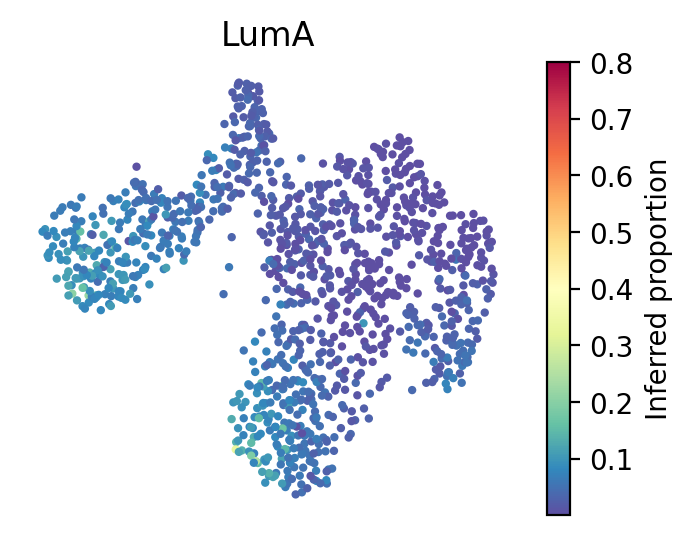

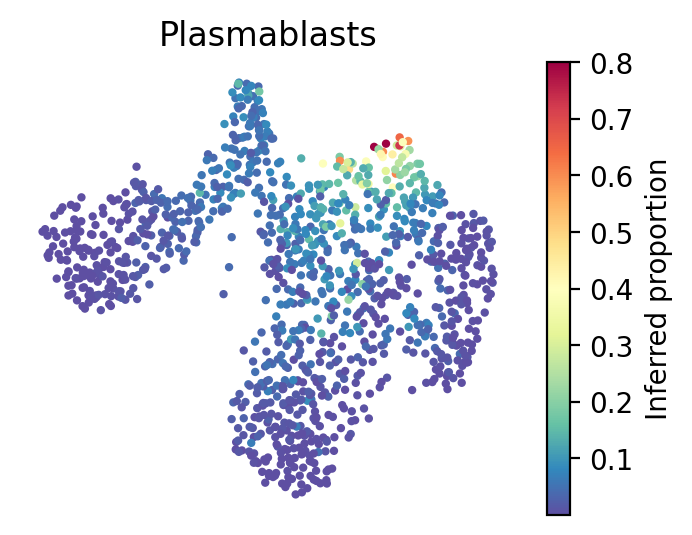

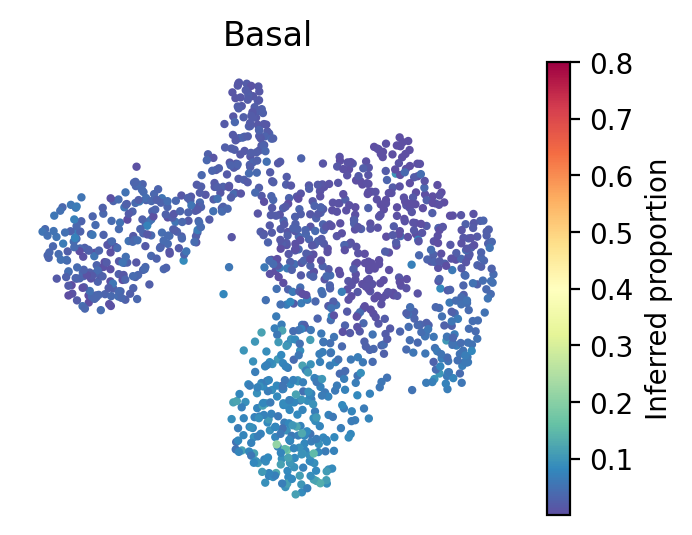

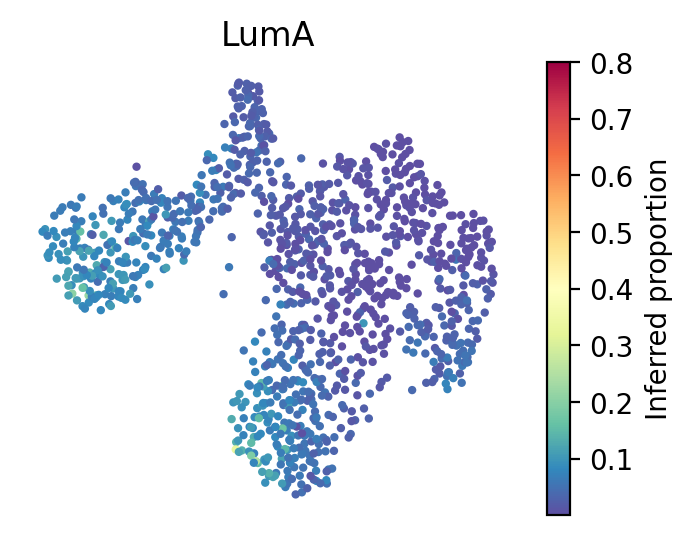

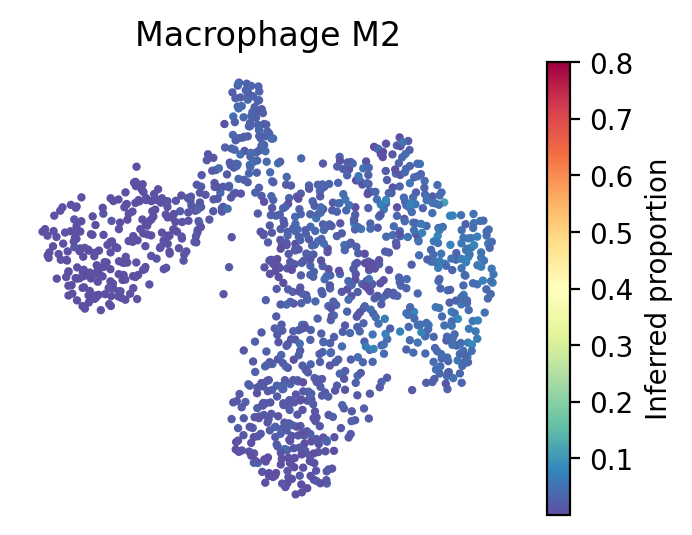

In [ ]:
for idx in celltype_indices:

    # Inferred proportions on starfysh learnt latent dimension
    plot_utils.pl_umap_feature(adata,
                   u,
                   inference_outputs,
                   feature='qc_m',
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=4,
                   vmax=0.8)

##### Infer cell-type specific expressions for each spot

In [ ]:
pred_exp = {}
for i, label in enumerate(gene_sig.columns):
    pred_exp[label] = starfysh.model_ct_exp(model,
                                            adata,
                                            visium_args.sig_mean_znorm,
                                            device,
                                            visium_args.log_lib,
                                            ct_idx=i
                                           ).tolist()


Plot spot-level expression of `IL7R` from *Effector Memory T cells (Tem)*:


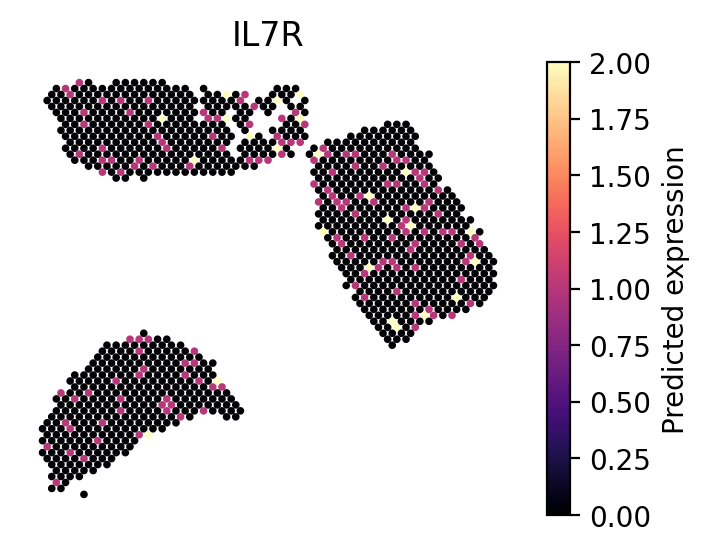

In [ ]:
sample_gene = 'IL7R'
sample_cell_type = 'Tem'
idx = list(adata.var_names[adata.var['highly_variable']]).index(sample_gene)

plot_utils.pl_spatial_inf_gene(adata,
                   map_info,
                   feature=np.asarray(pred_exp[sample_cell_type]),
                   idx= idx,
                   plt_title=list(adata.var_names[adata.var['highly_variable']])[idx],
                   label='Predicted expression',
                   s=3,
                   vmax=2)


#### Parse Starfysh inference output (**Starfysh with PoE**)

In [ ]:
inference_outputs_poe = model_poe.inference(torch.Tensor(adata.to_df().values).to(device))
img_outputs = model_poe.predict_imgVAE(torch.Tensor(visium_args.get_img_patches()).float().to(device))
sig_means = torch.Tensor(visium_args.sig_mean_znorm.values).to(device)
generative_outputs_poe = model_poe.generative(
    inference_outputs,
    sig_means,
    img_outputs
)

u = post_analysis.get_z_umap(inference_outputs_poe, map_info)
u = pd.DataFrame(u,columns=['umap1','umap2'])
u.index = map_info.index

#### Visualize starfysh deconvolution results (with PoE)

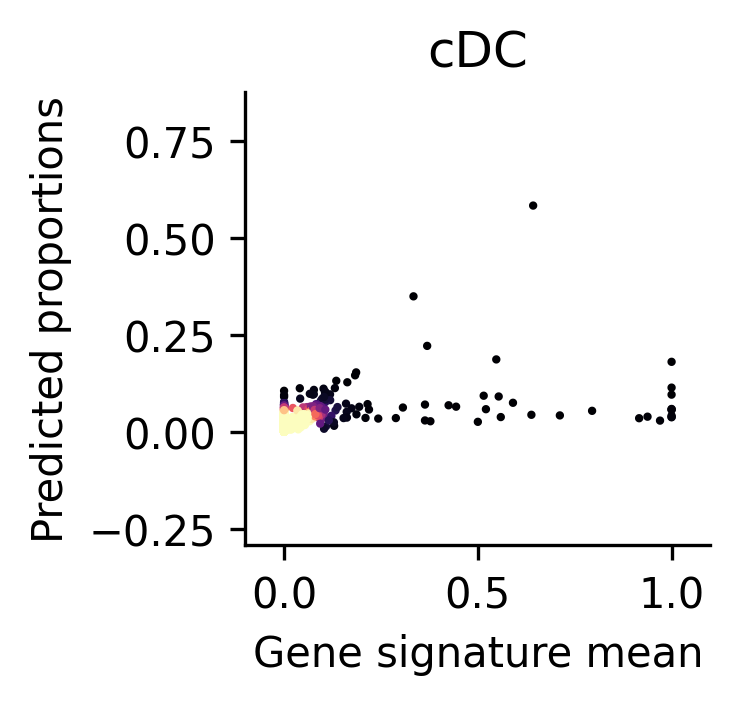

In [ ]:
idx = np.random.randint(0, n_cell_types)
gene_mean_vs_inferred_prop(inference_outputs_poe,
                                         visium_args,
                                         idx=idx
                                        )

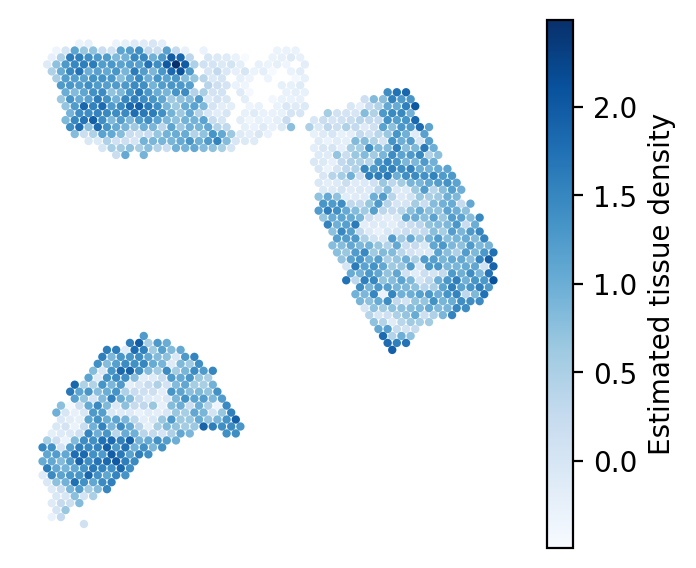

In [ ]:
plot_utils.pl_spatial_inf_feature(adata,
                                  map_info,
                                  inference_outputs_poe,
                                  feature='ql_m',
                                  idx=0,
                                  plt_title='',
                                  label='Estimated tissue density',
                                  s=4,
                                  cmap='Blues'
                                 )

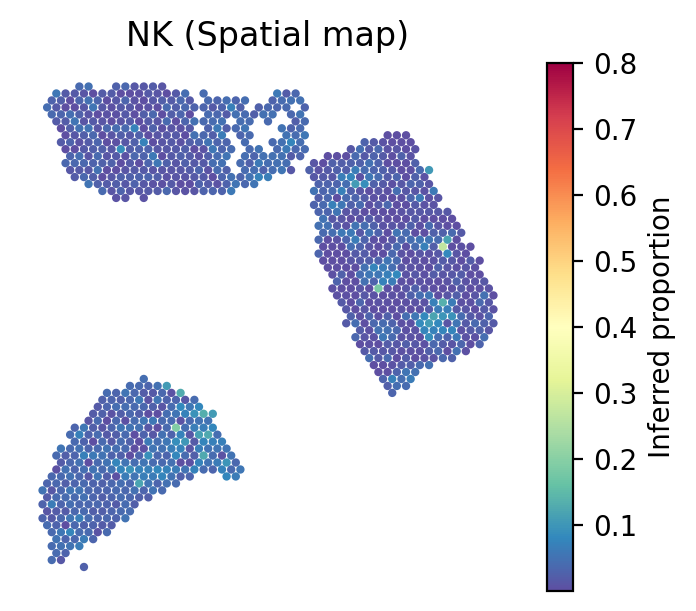

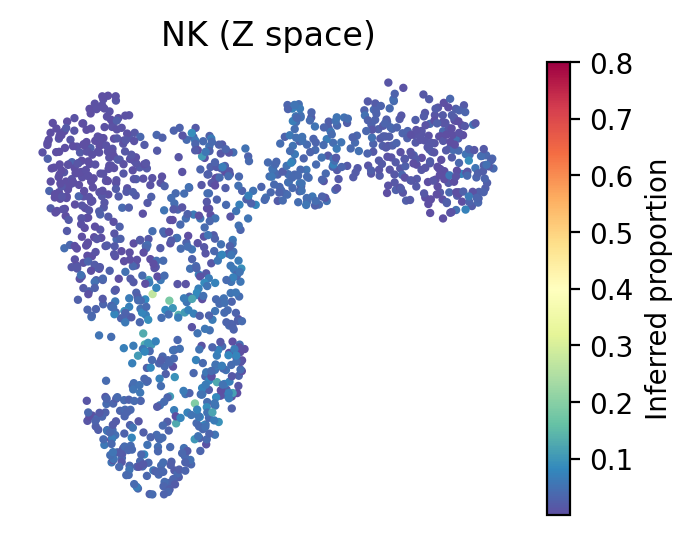

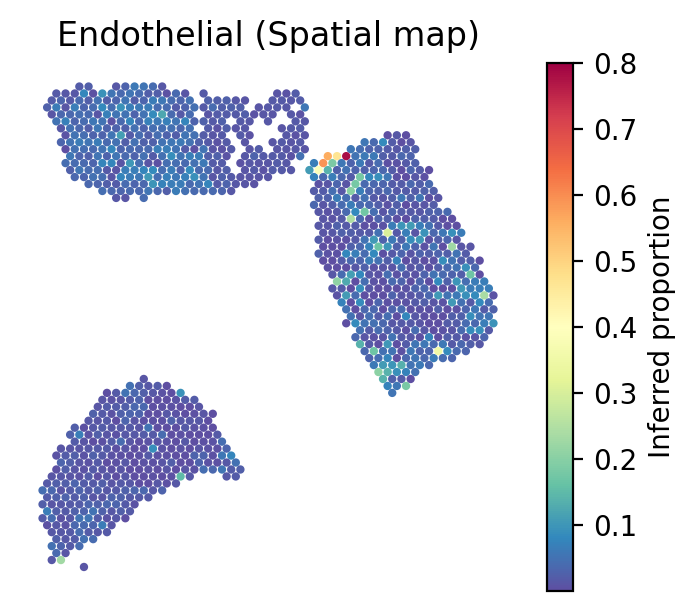

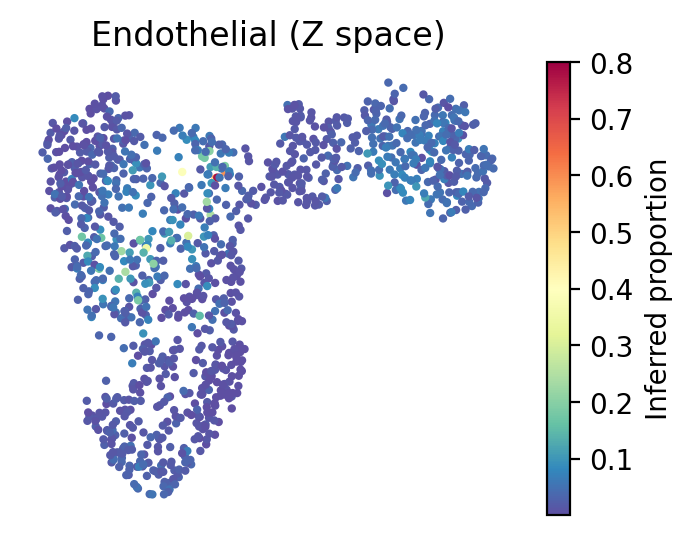

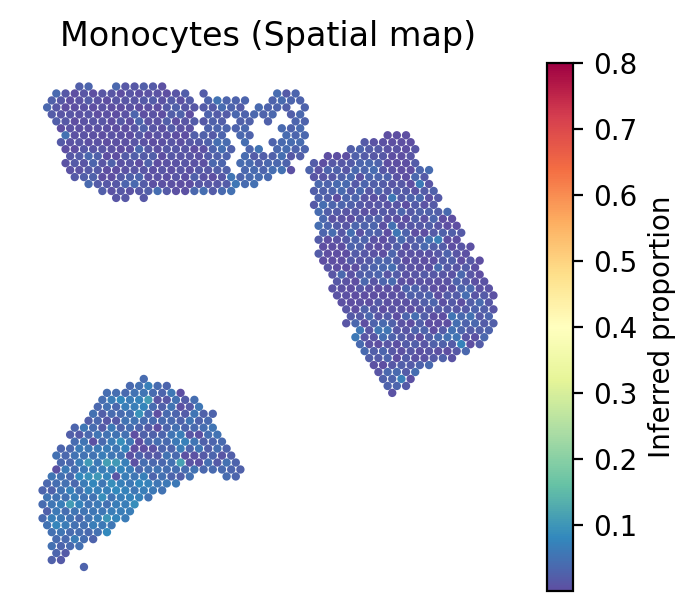

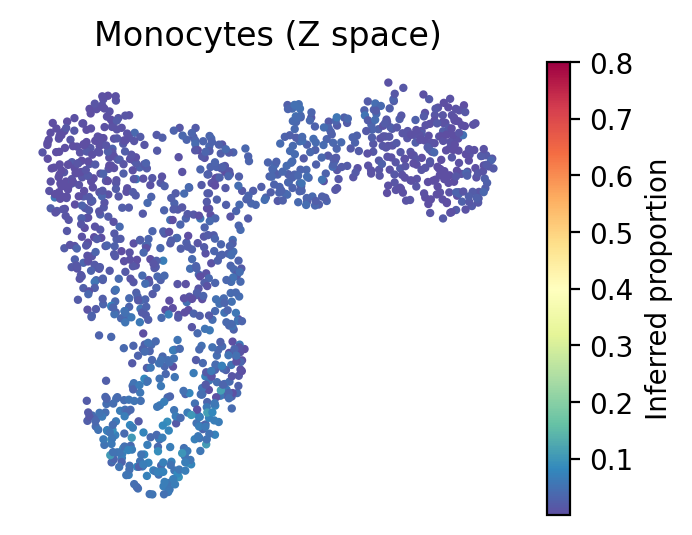

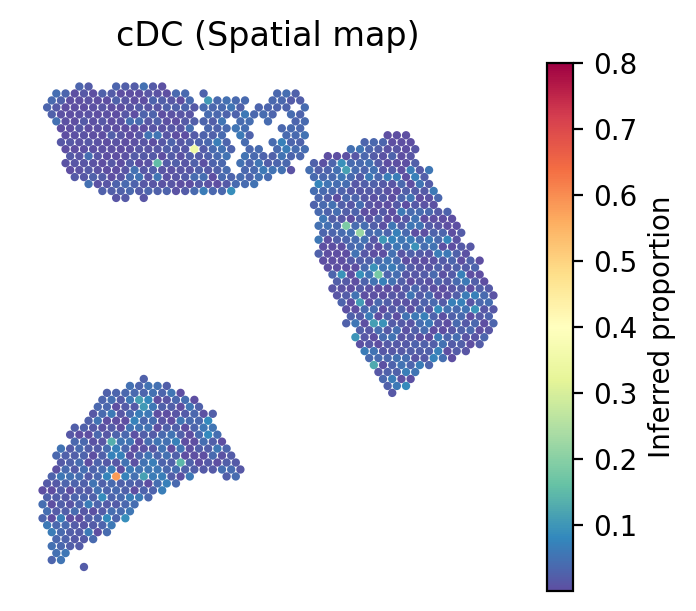

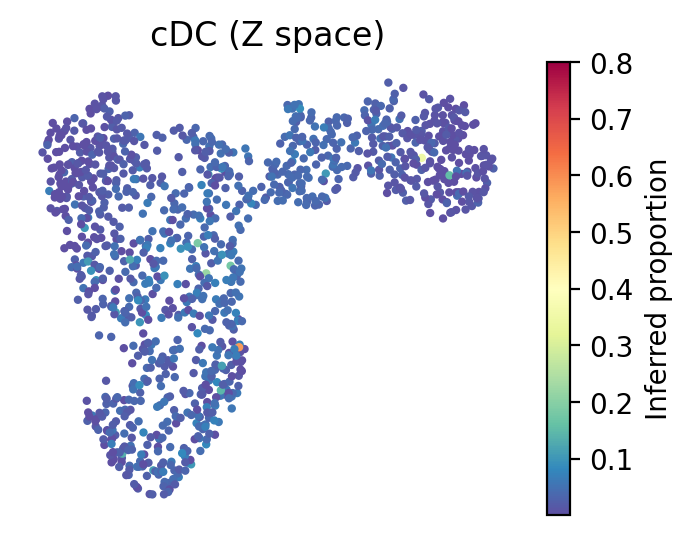

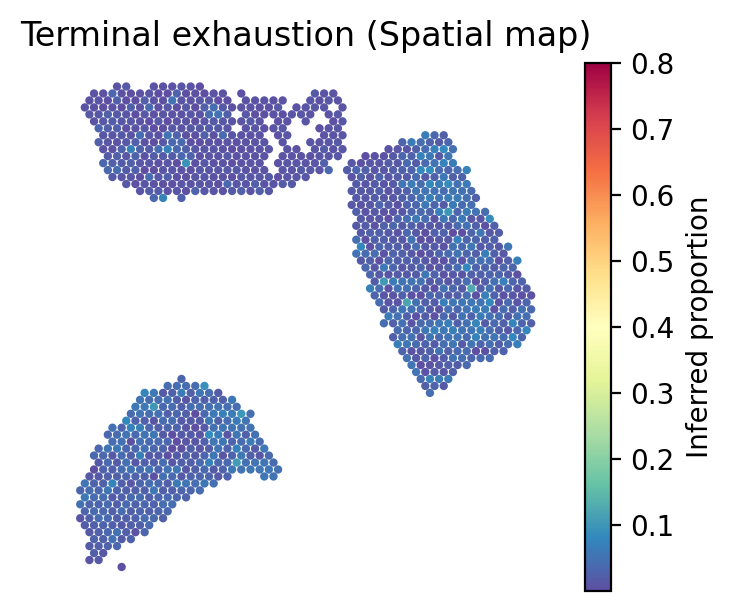

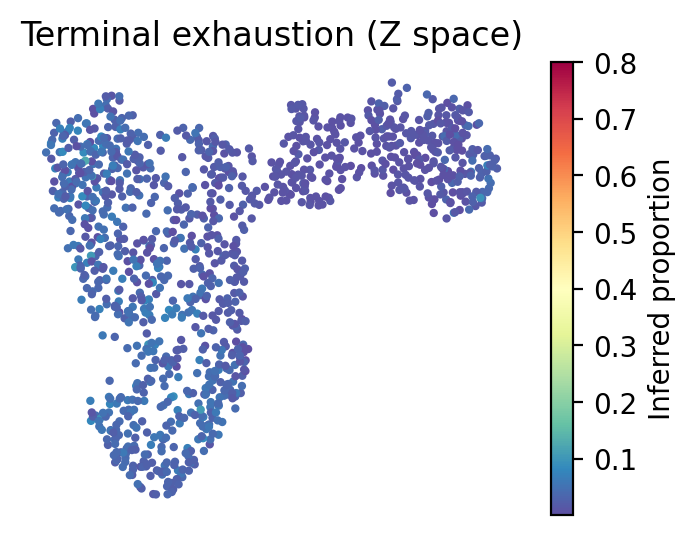

In [ ]:
# Randomly choose cell types to visualize
celltype_indices = np.random.randint(0, n_cell_types, size=5)

for idx in celltype_indices:

    # Inferred proportions on ST spatial coordinates
    plot_utils.pl_spatial_inf_feature(adata,
                       map_info,
                       inference_outputs_poe,
                       feature='qc_m',
                       idx=idx,
                       plt_title=gene_sig.columns[idx] + ' (Spatial map)',
                       label='Inferred proportion',
                       s=4,
                       vmax=0.8
                       )

    # Inferred proportions on starfysh learnt latent dimension
    plot_utils.pl_umap_feature(adata,
                   u,
                   inference_outputs_poe,
                   feature='qc_m',
                   idx=idx,
                   plt_title=gene_sig.columns[idx] + ' (Z space)',
                   label='Inferred proportion',
                   s=4,
                   vmax=0.8)

##### Unique output for PoE: visualize images

## Save starfysh results

we provided two types of integrations:

- 1. Run starfysh separately on each sample, then combine the starfysh results to step down to the integrated downstream analysis (tutorial 2)
- 2. Run starfysh on all samples together (tutorial 3)


To run option 1, please save the results first as shown below before run tutorial 2:

---